In [117]:
import pandas as pd
import numpy as np


# Dataframe upload

In [118]:
df_com = pd.read_csv("df_com.csv")
df_genes = pd.read_csv("df_genes.csv")
print(df_com.shape)
print(df_genes.shape)

(1098, 1703)
(1287, 1701)


In [119]:
df_com.drop("Unnamed: 0", axis=1, inplace=True)
print(df_com.isna().sum().sum())
df_com.head()

0


,ATG9A,ZNF211,DDX1,IL2RG,FYN,NR4A2,IRF8,CISH,RHOF,THBS3,...,ODC1,MINK1,BTN3A3,DENND4A,IL12RB1,SLC39A4,CORO1C,UGCG,MAT2A,IL1RAP
0,0.486972,0.534009,0.104154,2.402546,0.832553,1.689604,1.124592,2.758832,2.222386,-0.309677,...,0.419522,3.129827,0.775137,4.050185,1.281723,2.593608,1.734561,0.021469,1.878855,1.469285
1,0.465958,0.402833,-0.281424,2.108245,0.487192,1.736891,0.714427,1.625407,2.107331,0.238731,...,-0.051773,3.819450,0.339544,4.094491,1.382632,2.554416,2.557903,0.313440,0.641553,1.426374
2,0.623561,0.423330,-0.037901,2.253060,0.377553,1.311302,0.403267,2.796116,2.045010,0.014733,...,0.677766,3.536953,0.075735,3.481589,1.166399,2.530901,2.568458,0.784169,0.813150,1.975634
3,0.639322,0.575002,-0.146134,2.472617,0.426890,1.318057,0.537632,3.392655,2.236768,-0.004577,...,1.207166,3.586806,0.161626,3.695736,1.238477,2.593608,1.935118,0.432612,1.183437,1.816864
4,0.413423,0.423330,0.090625,2.211017,0.799662,1.642316,1.096305,1.498643,2.150477,0.045629,...,0.161278,3.620040,0.584949,4.205257,1.550814,2.624961,2.526236,0.408777,0.984746,1.477867


In [120]:
df_genes.drop("Unnamed: 0", axis=1, inplace=True)
print(df_genes.isna().sum().sum())
df_genes.head()

0


,ATG9A,ZNF211,DDX1,IL2RG,FYN,NR4A2,IRF8,CISH,RHOF,THBS3,...,ODC1,MINK1,BTN3A3,DENND4A,IL12RB1,SLC39A4,CORO1C,UGCG,MAT2A,IL1RAP
0,-1.266681,-1.844624,-2.921224,-0.261718,-1.380891,-1.311371,-2.028420,-3.348949,-0.049204,-1.824855,...,-2.765223,-1.227618,-2.358430,-2.209990,-1.149507,-2.238774,-4.096888,-2.575958,-3.841051,-1.525279
1,-1.285693,-1.752544,-2.999386,-0.123138,-0.958435,-1.287498,-2.240352,-3.061033,-0.149668,-1.765193,...,-2.107364,-0.361385,-2.081767,-2.108001,-1.232411,-1.904597,-4.891248,-2.747038,-3.657248,-1.720214
2,-1.391038,-1.755140,-2.402784,-0.219527,-0.830394,-1.092442,-1.939648,-3.357626,-0.390041,-1.904122,...,-1.315113,-1.206113,-1.927596,-1.694585,-1.235158,-2.145192,-3.909969,-2.288555,-3.796965,-1.733957
3,-1.286453,-1.957465,-2.848912,-0.185625,-1.798926,-1.298205,-1.871869,-2.976907,-0.599502,-1.869118,...,-2.231493,-0.989209,-3.020255,-2.056972,-1.056148,-1.916963,-3.048539,-0.927584,-4.031656,-1.315543
4,-1.378772,-1.864100,-2.824652,-0.127620,-2.047184,-1.338181,-1.812250,-3.437493,-0.415633,-1.815999,...,-2.510097,-1.345949,-2.671425,-1.995334,-1.225424,-1.937034,-3.538276,-0.412579,-3.966546,-1.253890


In [121]:
X = df_com.drop("death", axis=1) # all variables
y = df_com.death


X1 = df_genes.drop("death", axis=1) # genes only
y1 = df_genes.death


## Metrics

https://neptune.ai/blog/balanced-accuracy

https://neptune.ai/blog/f1-score-accuracy-roc-auc-pr-auc

https://en.wikipedia.org/wiki/Evaluation_of_binary_classifiers#Single_metrics

**accuracy_score**

**balanced_accuracy_score** (better then **accuracy_score** because of slightly imballanced data)

**f1_score**  !!!           (robust)

**recall_score**

**precision_score**

**precision_recall_curve**  (robust)

**AUC**

## Feature selection procedure


ExhaustiveFeatureSelector (top 100 features) - a lot of possible variants

Forward Feature selection (top 100 features) - decreases the models performance

Backward Feature selection (top 100 features) - decreases the models performance


## Feature selection (top 100 features) 

In [122]:
#!pip install mlxtend

In [123]:
#from mlxtend.feature_selection import SequentialFeatureSelector as sfs
#from sklearn.linear_model import LogisticRegression

In [124]:
# Considering all data we can choose the top 100 most important features
# Once selected I have commented the code considering the obtained list

#sfs1 = sfs(LogisticRegression(max_iter=10000), 
#           k_features=100, 
#           forward=True, 
#          floating=False,
#           verbose=2,
           # scoring="f1", # it decreases the models ability to predict
#           cv=5)
#sfs1.fit(X, y)
#features = list(sfs1.k_feature_names_)
#features


# Logistic regression


## Greadsearch LR

In [125]:
import sklearn
from numpy import hstack
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, precision_recall_curve, recall_score, precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_validate


In [126]:
from pprint import pprint
lr = LogisticRegression()
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(lr.get_params())


Parameters currently in use:

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}


In [127]:
#sklearn.metrics.get_scorer_names()


In [128]:
from sklearn.model_selection import train_test_split

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42, stratify=y)


### features selection by low variance

In [129]:
X_train

,ATG9A,ZNF211,DDX1,IL2RG,FYN,NR4A2,IRF8,CISH,RHOF,THBS3,...,ODC1,MINK1,BTN3A3,DENND4A,IL12RB1,SLC39A4,CORO1C,UGCG,MAT2A,IL1RAP
246,-0.914064,-0.676491,-0.931012,1.481727,-2.798111,-1.171849,-1.484026,-1.056492,-1.093164,-1.365522,...,-0.589521,-0.665297,0.060503,-0.595303,0.951917,-0.449873,-0.705779,0.218075,-0.591358,0.700507
254,-0.691362,-1.107041,-1.509359,1.751115,-3.011370,-0.847115,-0.692181,-0.975792,-1.264905,-1.279233,...,-1.500772,-0.054327,-0.070044,-0.391338,0.089019,-0.562627,-1.042446,0.661011,-1.316480,0.312112
1070,0.449951,0.147607,0.152442,-0.282428,0.036524,0.286171,0.540372,-1.314204,0.101667,0.301438,...,0.317686,0.014167,-0.079483,-0.306519,-0.203686,0.136465,0.778883,-0.681146,0.299416,-0.695234
644,0.279581,0.443974,0.082395,0.163203,0.186482,2.119621,0.052858,0.757026,1.033095,0.210710,...,-0.234947,2.366739,0.258953,1.856750,1.169063,2.060715,0.049181,0.383351,-0.247493,0.976551
112,-0.388875,-0.579856,-0.482660,0.741273,-0.249449,-0.590931,-0.869678,-0.300600,0.273003,-0.777448,...,-0.380972,1.339865,0.224744,1.535184,0.632077,0.417375,-0.463165,-1.779908,-1.291434,-0.607116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,0.303242,0.198408,0.957594,-0.681962,0.575505,0.379965,1.225359,0.430295,0.230292,0.014241,...,0.543011,-0.524456,0.344036,-0.262889,-0.634909,0.479682,-0.339843,-0.272175,0.775481,-0.558547
909,0.452747,-0.062182,0.317778,-0.413715,0.374653,0.471415,0.528699,-0.371771,0.014310,0.305527,...,0.350369,-0.477103,0.210965,-0.729669,-0.334711,0.192399,0.026645,-0.006673,0.669934,-0.661760
16,-0.250197,-1.383383,-1.857790,1.880089,1.053027,-1.222365,-0.682559,-0.445382,1.273373,-1.246653,...,-0.709705,-0.699993,0.188742,0.239343,-0.978838,-0.520379,0.159203,-4.203747,-0.814923,-0.382977
158,-1.109047,-0.048132,0.571483,-0.234906,0.188161,0.705168,0.670022,-0.279325,0.441501,0.032039,...,0.255540,1.527240,-0.197761,0.173522,0.227774,-2.590049,0.107867,-0.851988,1.014233,-0.685061


In [130]:
#from sklearn.feature_selection import VarianceThreshold


#var_thr = VarianceThreshold(threshold = 0.8) #Removing both constant and quasi-constant
#var_thr.fit(X_train)

#var_thr.get_support()
#array([False,  True,  True,  True,  True,  True,  True,  True, False])

#concol = [column for column in X_train.columns 
#          if column not in X_train.columns[var_thr.get_support()]]



In [131]:
#X_train.drop(concol,axis=1, inplace=True)
#X_train.shape

In [132]:
#X_test.drop(concol,axis=1, inplace=True)
#X_test.shape

In [133]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import json

grid={"C":np.logspace(-3,3,7),
      "penalty":["l1","l2"]} # l1 lasso l2 ridge

#parameters = [{'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']},
#              {'penalty':['none', 'elasticnet', 'l1', 'l2']},
#              {'C':[1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]}]

logreg=LogisticRegression(solver='liblinear', max_iter=10000)
logreg_cv=GridSearchCV(logreg, grid, cv=5, scoring = "f1")

logreg_cv.fit(X_train, y_train)

# Get the best model from the GridSearchCV
best_model = logreg_cv.best_estimator_

# Access the best parameters
best_params = logreg_cv.best_params_

# Access the best cross-validated score
best_score = logreg_cv.best_score_

# Access the entire results summary
results_summary = logreg_cv.cv_results_

# Now you can save these results to a file or print them
# For example, to save to a JSON file:
results_dict = {
    "best_model": best_model,
    "best_params": best_params,
    "best_score": best_score,
    "results_summary": results_summary
}

# Evaluate the best model on the testing data
# f1_score_test = best_model.score(X_test, y_test)

print("tuned hyperparameters :(best parameters) ", logreg_cv.best_params_)

y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


#tuned hyperparameters :(best parameters)  {'C': 0.1, 'penalty': 'l2'}
#0.8409090909090909 0.7671402432461523 0.6666666666666667 0.6140350877192983 0.7291666666666666
#[[150  13]
# [ 22  35]]


tuned hyperparameters :(best parameters)  {'C': 100.0, 'penalty': 'l1'}
0.7727272727272727 0.698310192659563 0.5535714285714286 0.543859649122807 0.5636363636363636
[[139  24]
 [ 26  31]]


In [134]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "LR.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(results_dict, pickle_file)
    
    
# Specify the file name of the .pkl file
file_name = "LR.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    LR = pickle.load(pickle_file)

In [135]:
best_model = LR['best_model']

y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.7727272727272727 0.698310192659563 0.5535714285714286 0.543859649122807 0.5636363636363636
[[139  24]
 [ 26  31]]


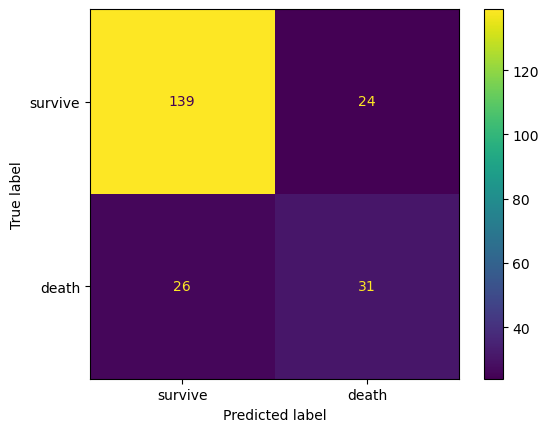

In [136]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();


## Simple LR

In [137]:
### Gread search is better
lr=LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))

#0.8090909090909091 0.734258960284146 0.6111111111111113 0.5789473684210527 0.6470588235294118
#[[145  18]
# [ 24  33]]



0.8090909090909091 0.734258960284146 0.6111111111111113 0.5789473684210527 0.6470588235294118
[[145  18]
 [ 24  33]]


In [138]:


# Specify the file name where you want to save the dictionary
file_name = "LRs.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(lr, pickle_file)
    
    



In [279]:
import pickle # save and upload the models characteristics

# Specify the file name of the .pkl file
file_name = "LRs.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    LRs = pickle.load(pickle_file)
    

In [280]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

best_model_ = LRs

y_pred = best_model_.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))

0.8090909090909091 0.734258960284146 0.6111111111111113 0.5789473684210527 0.6470588235294118
[[145  18]
 [ 24  33]]


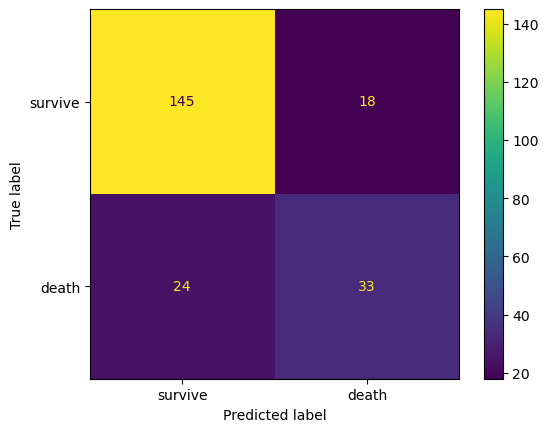

In [281]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();


No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.784


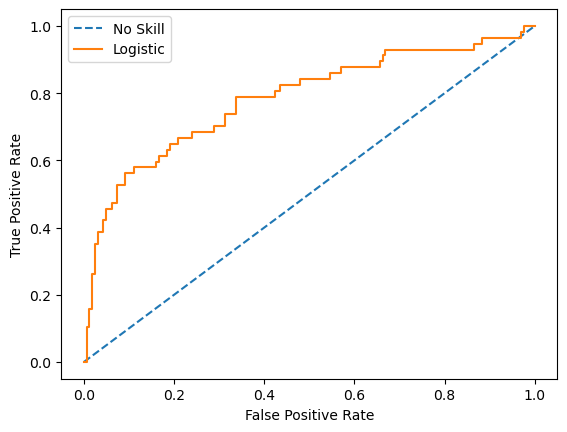

In [282]:
#https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

# roc curve and auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
# fit a model
lr_probs = best_model_.predict_proba(X_test)
#rf_probs = rf.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
#rf_probs = rf_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
#rf_auc = roc_auc_score(y_test, rf_probs)
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
#print('Rabdom Forest: ROC AUC=%.3f' % (rf_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
#rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, label='Logistic')
#pyplot.plot(rf_fpr, rf_tpr, label='Random Forest')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


Logistic: f1=0.611 auc=0.605


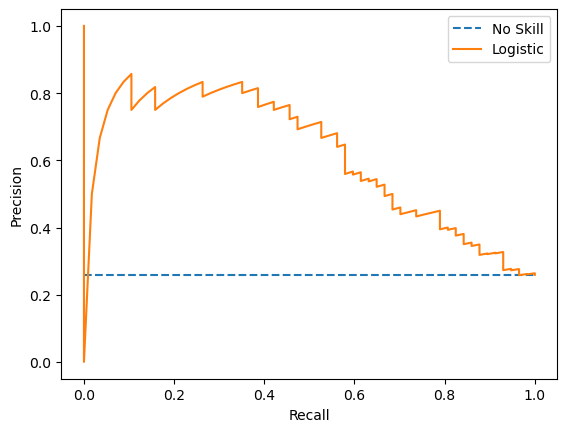

In [283]:
# precision-recall curve and f1
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot

# predict probabilities
lr_probs = best_model_.predict_proba(X_test)
#rf_probs = rf.predict_proba(X_train)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
#rf_probs = rf_probs[:, 1]
# predict class values
yhat = best_model_.predict(X_test)
#yhat_1 = rf.predict(X_train)

lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
#rf_precision, rf_recall, _ = precision_recall_curve(y_train, rf_probs)

lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)
#rf_f1, rf_auc = f1_score(y_train, yhat_1), auc(rf_recall, rf_precision)
# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
#print('Random Forest: f1=%.3f auc=%.3f' % (rf_f1, rf_auc))

# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
pyplot.plot(lr_recall, lr_precision, label='Logistic')
#pyplot.plot(rf_recall, rf_precision, label='Random Forest')
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

# Random Forest

In [144]:
#https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

from sklearn.ensemble import RandomForestRegressor
rf = RandomForestClassifier()
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf.get_params())


Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


## Random forest greadsearch

In [145]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Create the parameter grid based on the results of random search
param_grid = {
    'bootstrap': [True],
    'max_depth': [40, 50, 60, 70, 80, 90, 100],
    'max_features': [3, 4, 5],
    'min_samples_leaf': [2, 3, 4],
    'min_samples_split': [6, 8, 10],
    'n_estimators': [50, 60, 70, 80, 90, 100]
}

# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid,
                           scoring="f1", cv = 5, n_jobs = -1)

grid_search.fit(X_train, y_train)
# Get the best model from the GridSearchCV
best_model2 = grid_search.best_estimator_


# Access the best parameters
best_params2 = grid_search.best_params_

# Access the best cross-validated score
best_score2 = grid_search.best_score_

# Access the entire results summary
results_summary2 = grid_search.cv_results_

# Now you can save these results to a file or print them
# For example, to save to a JSON file:
results_dict = {
    "best_model": best_model2,
    "best_params": best_params2,
    "best_score": best_score2,
    "results_summary": results_summary2
}

# Evaluate the best model on the testing data
# f1_score_test = best_model2.score(X_test, y_test)

print("tuned hyperparameters :(best parameters) ", grid_search.best_params_)

y_pred = best_model2.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))

### without f1 score
#tuned hyperparameters :(best parameters)  {'bootstrap': True, 'max_depth': 60, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 80}
#0.7909090909090909 0.5964912280701754 0.3235294117647059 0.19298245614035087 1.0
#[[163   0]
# [ 46  11]]

### with f1 score
#tuned hyperparameters :(best parameters)  {'bootstrap': True, 'max_depth': 70, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 50}
#0.7772727272727272 0.575879883758476 0.26865671641791045 0.15789473684210525 0.9
#[[162   1]
# [ 48   9]]


tuned hyperparameters :(best parameters)  {'bootstrap': True, 'max_depth': 60, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 8, 'n_estimators': 70}
0.759090909090909 0.5407921644602304 0.15873015873015872 0.08771929824561403 0.8333333333333334
[[162   1]
 [ 52   5]]


In [146]:

### without f1 score
#tuned hyperparameters :(best parameters)  {'bootstrap': True, 'max_depth': 60, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 8, 'n_estimators': 50}
#0.7727272727272727 0.5728123990958992 0.2647058823529412 0.15789473684210525 0.8181818181818182  

#param_grid = {
#    'bootstrap': [True],
#    'max_depth': [40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150],
#    'max_features': [2, 3, 4, 5],
#    'min_samples_leaf': [2, 3, 4, 5, 6],
#    'min_samples_split': [6, 8, 10, 12, 14],
#    'n_estimators': [50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 1000]
#}

### f1 score
# tuned hyperparameters :(best parameters)  {'bootstrap': True, 'max_depth': 60, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 8, 'n_estimators': 70}
# 0.7772727272727272 0.5815843289204606 0.28985507246376807 0.17543859649122806 0.8333333333333334
# param_grid = {
#    'bootstrap': [True],
#    'max_depth': [40, 50, 60, 70, 80, 90, 100],
#    'max_features': [3, 4, 5],
#    'min_samples_leaf': [2, 3, 4],
#    'min_samples_split': [6, 8, 10],
#    'n_estimators': [50, 60, 70, 80, 90, 100]
#}

import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "RF.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(results_dict, pickle_file)
    
# Specify the file name of the .pkl file
file_name = "RF.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    RF = pickle.load(pickle_file)
    

In [147]:
best_model2 = RF['best_model']

y_pred = best_model2.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.759090909090909 0.5407921644602304 0.15873015873015872 0.08771929824561403 0.8333333333333334
[[162   1]
 [ 52   5]]


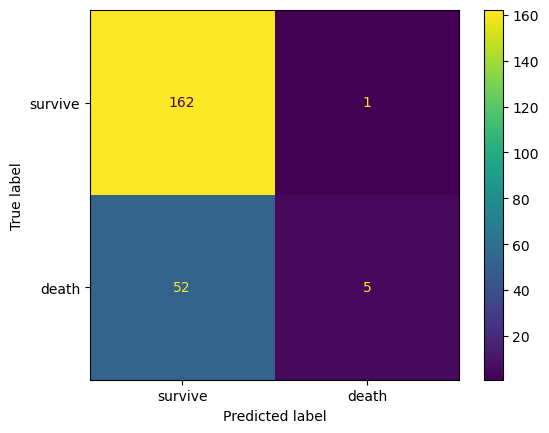

In [148]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();


## Random forest simple

In [149]:
## Simple is better

rf.fit(X_train, y_train)


RandomForestClassifier()

In [150]:
y_pred = rf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.7863636363636364 0.5934237434075987 0.3188405797101449 0.19298245614035087 0.9166666666666666
[[162   1]
 [ 46  11]]


In [151]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "RFs.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(rf, pickle_file)
    


In [284]:
# Specify the file name of the .pkl file
file_name = "RFs.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    RFs = pickle.load(pickle_file)
    

In [285]:
best_model2_ = RFs

y_pred = best_model2_.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))

0.7863636363636364 0.5934237434075987 0.3188405797101449 0.19298245614035087 0.9166666666666666
[[162   1]
 [ 46  11]]


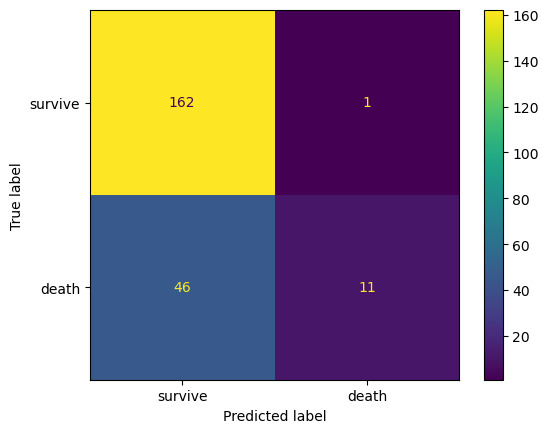

In [286]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();

No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.784
Random Forest: ROC AUC=0.820


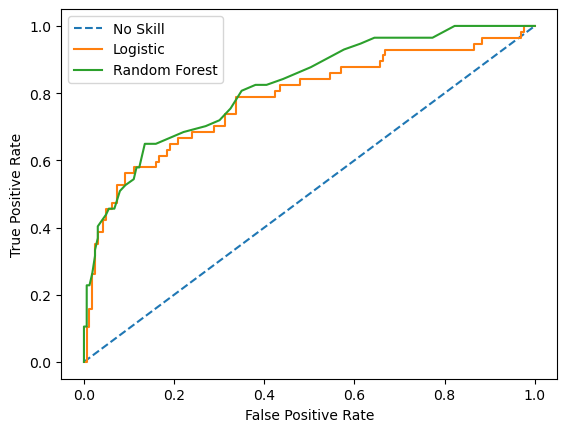

In [155]:
#https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

# roc curve and auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
# fit a model
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
rf_auc = roc_auc_score(y_test, rf_probs)
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
print('Random Forest: ROC AUC=%.3f' % (rf_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, label='Logistic')
pyplot.plot(rf_fpr, rf_tpr, label='Random Forest')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


Logistic: f1=0.611 auc=0.605
Random Forest: f1=0.319 auc=0.674


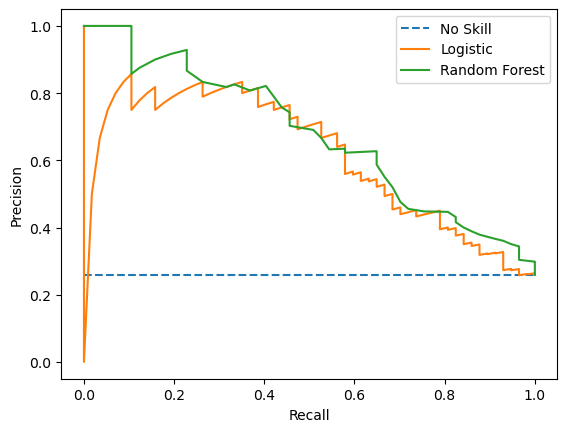

In [156]:
# precision-recall curve and f1
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot

# predict probabilities
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
# predict class values
yhat = best_model_.predict(X_test)
yhat_1 = best_model2_.predict(X_test)

lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)

lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)
rf_f1, rf_auc = f1_score(y_test, yhat_1), auc(rf_recall, rf_precision)
# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
print('Random Forest: f1=%.3f auc=%.3f' % (rf_f1, rf_auc))

# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
pyplot.plot(lr_recall, lr_precision, label='Logistic')
pyplot.plot(rf_recall, rf_precision, label='Random Forest')
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


# XGBClassifier

## XGB greadsearch

In [157]:
!pip install xgboost

In [158]:

from xgboost import XGBClassifier
XGB = XGBClassifier()
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(XGB.get_params())


Parameters currently in use:

{'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'objective': 'binary:logistic',
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'use_label_encoder': None,
 'validate_parameters': None,
 'verbosity': None}


In [159]:
estimator = XGBClassifier(
    objective= 'binary:logistic',
    nthread=4,
    seed=42
)


In [160]:
parameters = {
    'max_depth': range (2, 10, 1),
    'n_estimators': range(60, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05]
}

grid_search = GridSearchCV(estimator=estimator, param_grid=parameters,
                           scoring = 'f1', n_jobs = 8,  cv=5, verbose=True)
grid_search.fit(X_train, y_train)

best_model3 = grid_search.best_estimator_

# Access the best parameters
best_params3 = grid_search.best_params_

# Access the best cross-validated score
best_score3 = grid_search.best_score_

# Access the entire results summary
results_summary3 = grid_search.cv_results_

# Now you can save these results to a file or print them
# For example, to save to a JSON file:
results_dict = {
    "best_model": best_model3,
    "best_params": best_params3,
    "best_score": best_score3,
    "results_summary": results_summary3
}


# Evaluate the best model on the testing data
# f1_score_test = best_model2.score(X_test, y_test)

print("tuned hyperparameters :(best parameters) ", grid_search.best_params_)

y_pred = best_model3.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


# No f1
#tuned hyperparameters :(best parameters)  {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 140}
#0.8136363636363636 0.6802819933268754 0.528735632183908 0.40350877192982454 0.7666666666666667
#[[156   7]
# [ 34  23]]


# f1
#tuned hyperparameters :(best parameters)  {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 140}
#0.8136363636363636 0.6802819933268754 0.528735632183908 0.40350877192982454 0.7666666666666667
#[[156   7]
# [ 34  23]]



Fitting 5 folds for each of 96 candidates, totalling 480 fits
tuned hyperparameters :(best parameters)  {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 140}
0.8136363636363636 0.6802819933268754 0.528735632183908 0.40350877192982454 0.7666666666666667
[[156   7]
 [ 34  23]]


In [161]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "XGB.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(results_dict, pickle_file)
    
# Specify the file name of the .pkl file
file_name = "XGB.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    XGB = pickle.load(pickle_file)
    

In [162]:
best_model3 = XGB['best_model']

y_pred = best_model3.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.8136363636363636 0.6802819933268754 0.528735632183908 0.40350877192982454 0.7666666666666667
[[156   7]
 [ 34  23]]


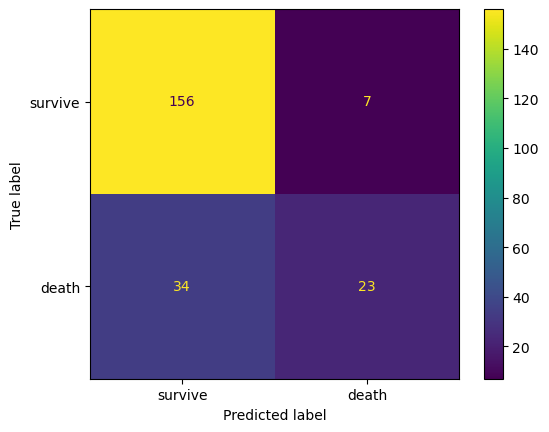

In [163]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();

## XGB simple

In [164]:

# Better than gread search
estimator = XGBClassifier(
    objective= 'binary:logistic',
    nthread=4,
    seed=42
)

In [165]:
estimator.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, nthread=4, num_parallel_tree=None,
              predictor=None, ...)

In [166]:
y_pred = estimator.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.8272727272727273 0.7180066731245291 0.5957446808510638 0.49122807017543857 0.7567567567567568
[[154   9]
 [ 29  28]]


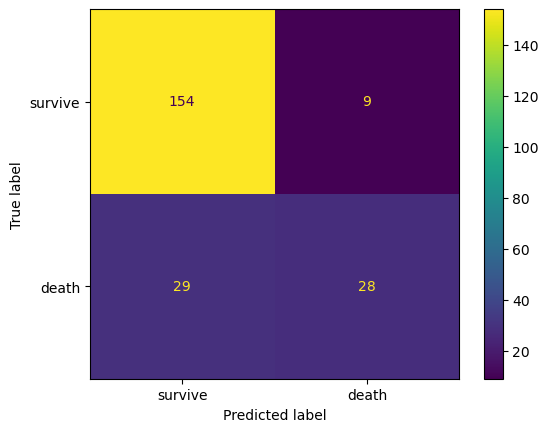

In [167]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();

In [168]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "XGBs.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(estimator, pickle_file)
    

    

In [169]:
# Specify the file name of the .pkl file
file_name = "XGBs.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    XGBs = pickle.load(pickle_file)

In [170]:
best_model3_ = XGBs

No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.784
Random Forest: ROC AUC=0.820
XGB: ROC AUC=0.825


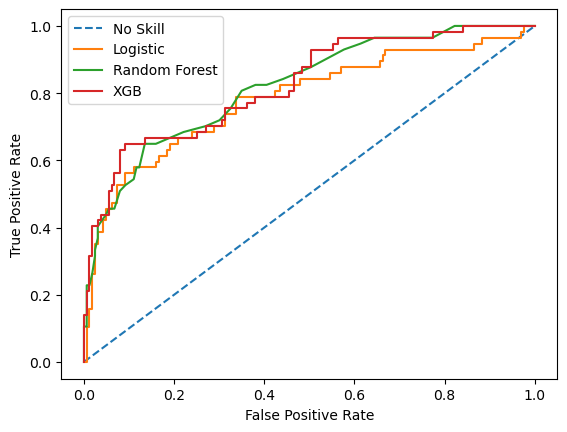

In [171]:
#https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

# roc curve and auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
# fit a model
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3_.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
rf_auc = roc_auc_score(y_test, rf_probs)
xg_auc = roc_auc_score(y_test, xg_probs)
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
print('Random Forest: ROC AUC=%.3f' % (rf_auc))
print('XGB: ROC AUC=%.3f' % (xg_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
xg_fpr, xg_tpr, _ = roc_curve(y_test, xg_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, label='Logistic')
pyplot.plot(rf_fpr, rf_tpr, label='Random Forest')
pyplot.plot(xg_fpr, xg_tpr, label='XGB')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


Logistic: f1=0.554 auc=0.605
Random Forest: f1=0.319 auc=0.674
XGB: f1=0.596 auc=0.700


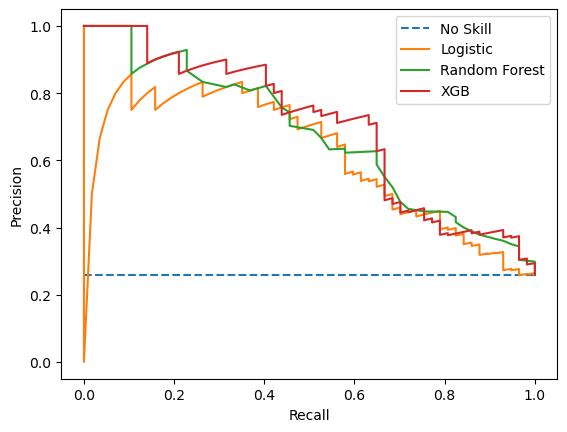

In [172]:
# precision-recall curve and f1
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot

# predict probabilities
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3_.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
# predict class values
yhat = best_model.predict(X_test)
yhat_1 = best_model2_.predict(X_test)
yhat_2 = best_model3_.predict(X_test)

lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)
xg_precision, xg_recall, _ = precision_recall_curve(y_test, xg_probs)

lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)
rf_f1, rf_auc = f1_score(y_test, yhat_1), auc(rf_recall, rf_precision)
xg_f1, xg_auc = f1_score(y_test, yhat_2), auc(xg_recall, xg_precision)

# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
print('Random Forest: f1=%.3f auc=%.3f' % (rf_f1, rf_auc))
print('XGB: f1=%.3f auc=%.3f' % (xg_f1, xg_auc))

# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
pyplot.plot(lr_recall, lr_precision, label='Logistic')
pyplot.plot(rf_recall, rf_precision, label='Random Forest')
pyplot.plot(xg_recall, xg_precision, label='XGB')
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


# LightGBM

## LightGBM greadsearch

In [173]:
!pip install lightgbm

In [174]:
import lightgbm as lgb

In [175]:
#https://neptune.ai/blog/lightgbm-parameters-guide

import lightgbm as lgb

# Define the LightGBM classifier
lgb_classifier = lgb.LGBMClassifier(force_col_wise=True)

# Define the hyperparameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],           # Number of boosting rounds
    'learning_rate': [0.4],         # Learning rate
    'max_depth': [3, 4, 5],                        # Maximum depth of trees
    'num_leaves': [6, 8, 10],
    'subsample': [0.2],             # Fraction of samples used for training
    'colsample_bytree': [0.8, 0.9, 1.0]       # Fraction of features used for training each tree
}

# Create GridSearchCV
grid_search = GridSearchCV(estimator=lgb_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=8)

# Fit the GridSearchCV to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Get the best estimator (model) from the search

best_model4 = grid_search.best_estimator_

# Access the best parameters
best_params4 = grid_search.best_params_

# Access the best cross-validated score
best_score4 = grid_search.best_score_

# Access the entire results summary
results_summary4 = grid_search.cv_results_


# Now you can save these results to a file or print them
# For example, to save to a JSON file:
results_dict = {
    "best_model": best_model4,
    "best_params": best_params4,
    "best_score": best_score4,
    "results_summary": results_summary4
}


# Evaluate the best model on the testing data
# f1_score_test = best_model2.score(X_test, y_test)

print("tuned hyperparameters :(best parameters) ", grid_search.best_params_)

y_pred = best_model4.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


[LightGBM] [Info] Number of positive: 183, number of negative: 520
[LightGBM] [Info] Total Bins 398775
[LightGBM] [Info] Number of data points in the train set: 703, number of used features: 1701
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.260313 -> initscore=-1.044343
[LightGBM] [Info] Start training from score -1.044343
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

In [176]:

import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "GBM.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(results_dict, pickle_file)
    





In [177]:
# Specify the file name of the .pkl file
file_name = "GBM.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    GBM = pickle.load(pickle_file)

In [178]:
best_model4 = GBM['best_model']

y_pred = best_model4.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.8409090909090909 0.7215046819502744 0.6067415730337079 0.47368421052631576 0.84375
[[158   5]
 [ 30  27]]


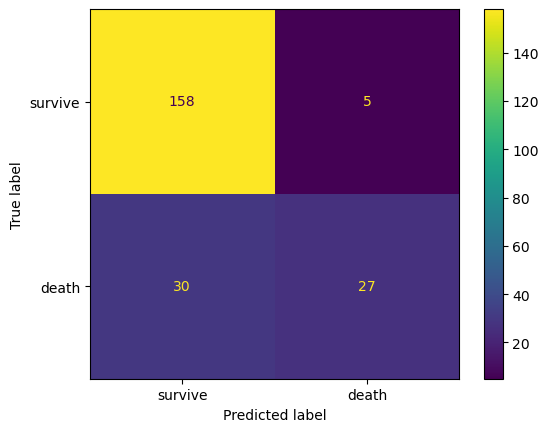

In [179]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();


## LightGBM simple

In [180]:
import lightgbm as lgb
lgb = lgb.LGBMClassifier()
lgb.fit(X_train, y_train)


[LightGBM] [Info] Number of positive: 228, number of negative: 650
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 433346
[LightGBM] [Info] Number of data points in the train set: 878, number of used features: 1701
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.259681 -> initscore=-1.047627
[LightGBM] [Info] Start training from score -1.047627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LGBMClassifier()

In [181]:
y_pred = lgb.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.8136363636363636 0.668873103002906 0.5060240963855421 0.3684210526315789 0.8076923076923077
[[158   5]
 [ 36  21]]


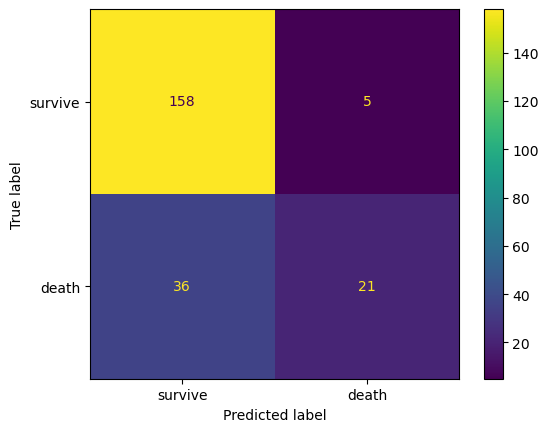

In [182]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                               
cmd.plot();


In [183]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "LGBs.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(lgb, pickle_file)
    
# Specify the file name of the .pkl file
file_name = "LGBs.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    LGBs = pickle.load(pickle_file)
    

In [184]:
best_model4_ = LGBs

No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.784
Random Forest: ROC AUC=0.820
XGB: ROC AUC=0.825
LGB: ROC AUC=0.808


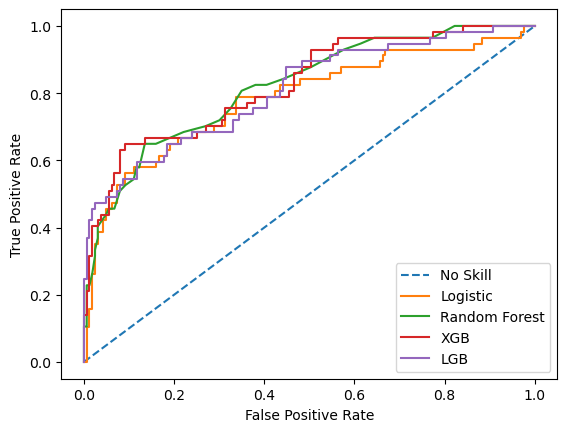

In [185]:
#https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

# roc curve and auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
# fit a model
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3_.predict_proba(X_test)
lg_probs = best_model4.predict_proba(X_test)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
lg_probs = lg_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
rf_auc = roc_auc_score(y_test, rf_probs)
xg_auc = roc_auc_score(y_test, xg_probs)
lg_auc = roc_auc_score(y_test, lg_probs)

# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
print('Random Forest: ROC AUC=%.3f' % (rf_auc))
print('XGB: ROC AUC=%.3f' % (xg_auc))
print('LGB: ROC AUC=%.3f' % (lg_auc))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
xg_fpr, xg_tpr, _ = roc_curve(y_test, xg_probs)
lg_fpr, lg_tpr, _ = roc_curve(y_test, lg_probs)

# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, label='Logistic')
pyplot.plot(rf_fpr, rf_tpr, label='Random Forest')
pyplot.plot(xg_fpr, xg_tpr, label='XGB')
pyplot.plot(lg_fpr, lg_tpr, label='LGB')

# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


Logistic: f1=0.611 auc=0.605
Random Forest: f1=0.319 auc=0.674
XGB: f1=0.596 auc=0.700
LGB: f1=0.607 auc=0.706


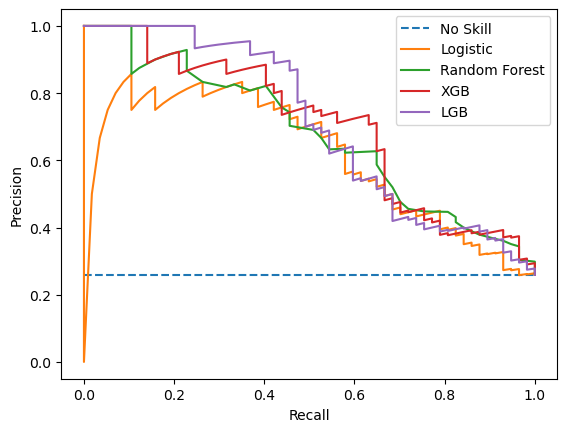

In [186]:
# precision-recall curve and f1
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot

# predict probabilities
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3_.predict_proba(X_test)
lg_probs = best_model4.predict_proba(X_test)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
lg_probs = lg_probs[:, 1]

# predict class values
yhat = best_model_.predict(X_test)
yhat_1 = best_model2_.predict(X_test)
yhat_2 = best_model3_.predict(X_test)
yhat_3 = best_model4.predict(X_test)

lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)
xg_precision, xg_recall, _ = precision_recall_curve(y_test, xg_probs)
lg_precision, lg_recall, _ = precision_recall_curve(y_test, lg_probs)

lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)
rf_f1, rf_auc = f1_score(y_test, yhat_1), auc(rf_recall, rf_precision)
xg_f1, xg_auc = f1_score(y_test, yhat_2), auc(xg_recall, xg_precision)
lg_f1, lg_auc = f1_score(y_test, yhat_3), auc(lg_recall, lg_precision)

# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
print('Random Forest: f1=%.3f auc=%.3f' % (rf_f1, rf_auc))
print('XGB: f1=%.3f auc=%.3f' % (xg_f1, xg_auc))
print('LGB: f1=%.3f auc=%.3f' % (lg_f1, lg_auc))

# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
pyplot.plot(lr_recall, lr_precision, label='Logistic')
pyplot.plot(rf_recall, rf_precision, label='Random Forest')
pyplot.plot(xg_recall, xg_precision, label='XGB')
pyplot.plot(lg_recall, lg_precision, label='LGB')

# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()



# SVM

## SVM greadserach

In [187]:
from sklearn.svm import SVC


In [188]:
from sklearn.svm import SVC

# Define the SVM classifier
svm_classifier = SVC(probability=True)

# Define the hyperparameter grid for GridSearchCV


param_grid = {
    'C': [0.1, 1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],              # Regularization parameter
    'kernel': ['linear', 'rbf'],    # Kernel type
    'gamma': ['scale', 'auto']      # Kernel coefficient for 'rbf' kernel
}

# Create GridSearchCV
grid_search = GridSearchCV(estimator=svm_classifier, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the GridSearchCV to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Get the best estimator (model) from the search

best_model5 = grid_search.best_estimator_

# Access the best parameters
best_params5 = grid_search.best_params_

# Access the best cross-validated score
best_score5 = grid_search.best_score_

# Access the entire results summary
results_summary5 = grid_search.cv_results_

# Now you can save these results to a file or print them
# For example, to save to a JSON file:
results_dict = {
    "best_model": best_model5,
    "best_params": best_params5,
    "best_score": best_score5,
    "results_summary": results_summary5
}


# Evaluate the best model on the testing data
# f1_score_test = best_model2.score(X_test, y_test)

print("tuned hyperparameters :(best parameters) ", grid_search.best_params_)

y_pred = best_model5.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [189]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "SVC.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(results_dict, pickle_file)
    

    

In [190]:
# Specify the file name of the .pkl file
file_name = "SVC.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    SVC = pickle.load(pickle_file)

In [191]:
best_model5 = SVC['best_model']

y_pred = best_model5.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.85 0.7618663222473361 0.6666666666666667 0.5789473684210527 0.7857142857142857
[[154   9]
 [ 24  33]]


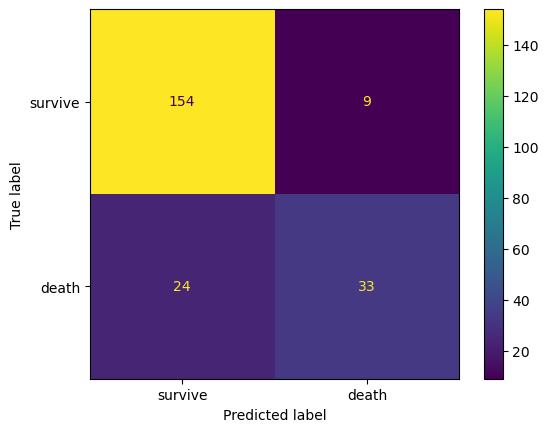

In [192]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();


## SVM simple

In [193]:
from sklearn.svm import SVC
svm = SVC(probability=True)
svm.fit(X_train, y_train)


SVC(probability=True)

In [194]:
y_pred = svm.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.7636363636363637 0.5495640942847917 0.1875 0.10526315789473684 0.8571428571428571
[[162   1]
 [ 51   6]]


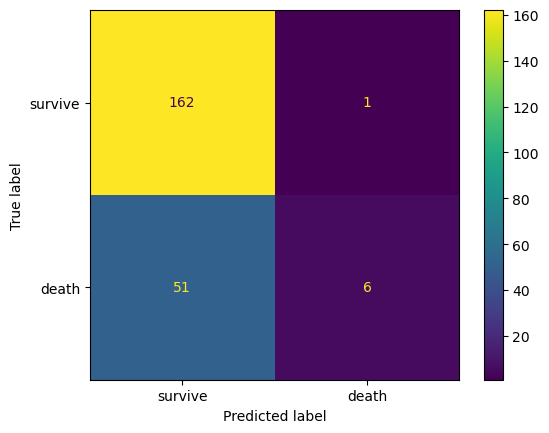

In [195]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                               
cmd.plot();


In [196]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "SVMs.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(svm, pickle_file)
    
# Specify the file name of the .pkl file
file_name = "SVMs.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    SVMs = pickle.load(pickle_file)
    
    

In [197]:
best_model5_ = SVMs


No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.784
Random Forest: ROC AUC=0.820
XGB: ROC AUC=0.825
LGB: ROC AUC=0.808
SVM: ROC AUC=0.844


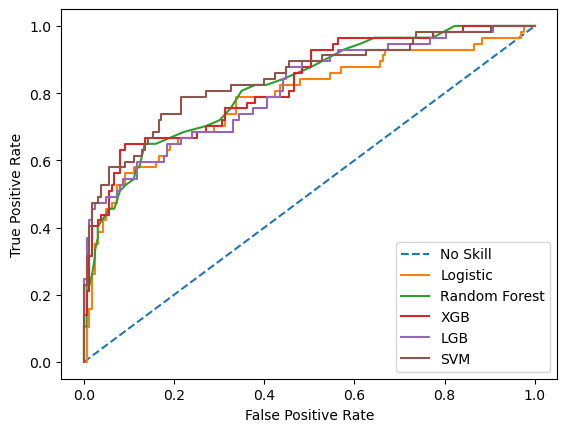

In [198]:
#https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

# roc curve and auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
# fit a model
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3_.predict_proba(X_test)
lg_probs = best_model4.predict_proba(X_test)
sv_probs = best_model5.predict_proba(X_test)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
lg_probs = lg_probs[:, 1]
sv_probs = sv_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
rf_auc = roc_auc_score(y_test, rf_probs)
xg_auc = roc_auc_score(y_test, xg_probs)
lg_auc = roc_auc_score(y_test, lg_probs)
sv_auc = roc_auc_score(y_test, sv_probs)

# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
print('Random Forest: ROC AUC=%.3f' % (rf_auc))
print('XGB: ROC AUC=%.3f' % (xg_auc))
print('LGB: ROC AUC=%.3f' % (lg_auc))
print('SVM: ROC AUC=%.3f' % (sv_auc))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
xg_fpr, xg_tpr, _ = roc_curve(y_test, xg_probs)
lg_fpr, lg_tpr, _ = roc_curve(y_test, lg_probs)
sv_fpr, sv_tpr, _ = roc_curve(y_test, sv_probs)

# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, label='Logistic')
pyplot.plot(rf_fpr, rf_tpr, label='Random Forest')
pyplot.plot(xg_fpr, xg_tpr, label='XGB')
pyplot.plot(lg_fpr, lg_tpr, label='LGB')
pyplot.plot(sv_fpr, sv_tpr, label='SVM')

# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


Logistic: f1=0.611 auc=0.605
Random Forest: f1=0.319 auc=0.674
XGB: f1=0.596 auc=0.700
LGB: f1=0.607 auc=0.706
SVM: f1=0.667 auc=0.745


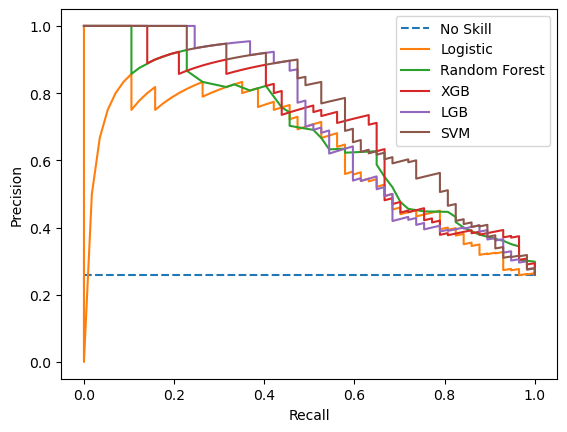

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [199]:
# precision-recall curve and f1
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot

# predict probabilities
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3_.predict_proba(X_test)
lg_probs = best_model4.predict_proba(X_test)
sv_probs = best_model5.predict_proba(X_test)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
lg_probs = lg_probs[:, 1]
sv_probs = sv_probs[:, 1]

# predict class values
yhat = best_model_.predict(X_test)
yhat_1 = best_model2_.predict(X_test)
yhat_2 = best_model3_.predict(X_test)
yhat_3 = best_model4.predict(X_test)
yhat_4 = best_model5.predict(X_test)

lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)
xg_precision, xg_recall, _ = precision_recall_curve(y_test, xg_probs)
lg_precision, lg_recall, _ = precision_recall_curve(y_test, lg_probs)
sv_precision, sv_recall, _ = precision_recall_curve(y_test, sv_probs)

lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)
rf_f1, rf_auc = f1_score(y_test, yhat_1), auc(rf_recall, rf_precision)
xg_f1, xg_auc = f1_score(y_test, yhat_2), auc(xg_recall, xg_precision)
lg_f1, lg_auc = f1_score(y_test, yhat_3), auc(lg_recall, lg_precision)
sv_f1, sv_auc = f1_score(y_test, yhat_4), auc(sv_recall, sv_precision)

# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
print('Random Forest: f1=%.3f auc=%.3f' % (rf_f1, rf_auc))
print('XGB: f1=%.3f auc=%.3f' % (xg_f1, xg_auc))
print('LGB: f1=%.3f auc=%.3f' % (lg_f1, lg_auc))
print('SVM: f1=%.3f auc=%.3f' % (sv_f1, sv_auc))

# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
pyplot.plot(lr_recall, lr_precision, label='Logistic')
pyplot.plot(rf_recall, rf_precision, label='Random Forest')
pyplot.plot(xg_recall, xg_precision, label='XGB')
pyplot.plot(lg_recall, lg_precision, label='LGB')
pyplot.plot(sv_recall, sv_precision, label='SVM')

# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


# Stacking

In [227]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import StackingClassifier
from matplotlib import pyplot


## Stacking greadsearch

In [262]:

# define the base models
level0 = list()
level0.append(('lr', best_model_))
level0.append(('rf', best_model2_))
level0.append(('XGB', best_model3))
level0.append(('GBM', best_model4))
level0.append(('SVM', best_model5))

# define meta learner model
level1 = LogisticRegression(solver='liblinear')

# define the stacking ensemble
model = StackingClassifier(estimators=level0, final_estimator=level1, cv=10)

params={'final_estimator__C': np.logspace(-3,3,7),
        'final_estimator__penalty': ["l1"]} # l1 lasso l2 ridge


grid = GridSearchCV(estimator=model, param_grid=params, cv=5, n_jobs=-1)

grid.fit(X_train, y_train)

# Get the best model from the GridSearchCV
best_model6 = grid.best_estimator_

# Access the best parameters
best_params6 = grid.best_params_

# Access the best cross-validated score
best_score6 = grid.best_score_

# Access the entire results summary
results_summary6 = grid.cv_results_

# Now you can save these results to a file or print them
# For example, to save to a JSON file:
results_dict = {
    "best_model": best_model6,
    "best_params": best_params6,
    "best_score": best_score6,
    "results_summary": results_summary6
}

#with open("grid_search_resultsStacking.json", "w") as json_file:
#    json.dump(results_dict, json_file, indent=4)

# Evaluate the best model on the testing data
# f1_score_test = best_model.score(X_test, y_test)

print("tuned hyperparameters :(best parameters) ", grid.best_params_)

y_pred = best_model6.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))

#scoring = "f1"
#tuned hyperparameters :(best parameters)  {'lr__C': 1000.0, 'lr__penalty': 'l1'}
#0.8409090909090909 0.7272091271122592 0.6153846153846154 0.49122807017543857 0.8235294117647058
#[[157   6]
# [ 29  28]]

##################################################################################
#from sklearn.datasets import make_classification
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.linear_model import LogisticRegression
#from sklearn.tree import DecisionTreeClassifier
#from sklearn.ensemble import StackingClassifier
#from sklearn.model_selection import GridSearchCV


#X, y = make_classification(n_samples=1000, n_features=4, 
#                            n_informative=2, n_redundant=0,
#                            random_state=0, shuffle=False)


#estimators = [('rf', RandomForestClassifier(n_estimators=10, random_state=42)),
#              ('logreg', LogisticRegression())]

#sclf = StackingClassifier(estimators= estimators , final_estimator=DecisionTreeClassifier())

#params = {'rf__n_estimators': [5,10]}

#grid = GridSearchCV(estimator=sclf, param_grid=params, cv=5)
#grid.fit(X, y)

#################################################################################
#clf1 = RandomForestClassifier()
#clf2 = LogisticRegression()
#dt = DecisionTreeClassifier()
#sclf = StackingClassifier(estimators=[clf1, clf2],final_estimator=dt)

#params = {'randomforestclassifier__n_estimators': [10, 50],
#          'logisticregression__C': [1,2,3]}

#grid = GridSearchCV(estimator=sclf, param_grid=params, cv=5)

#grid.fit(x, y)


[LightGBM] [Info] Number of positive: 182, number of negative: 520
[LightGBM] [Info] Total Bins 398221
[LightGBM] [Info] Number of data points in the train set: 702, number of used features: 1701
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.259259 -> initscore=-1.049822
[LightGBM] [Info] Start training from score -1.049822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

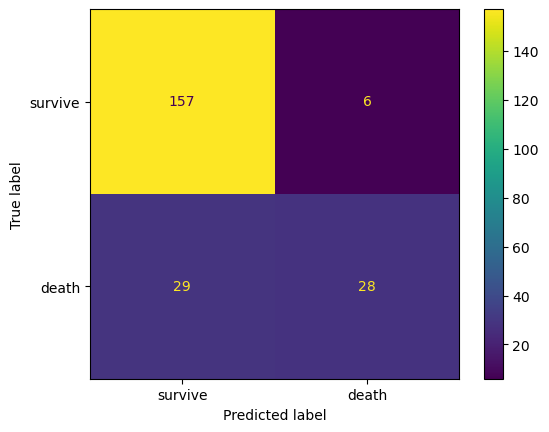

In [263]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                               
cmd.plot();

In [264]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "Staking.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(results_dict, pickle_file)
    
# Specify the file name of the .pkl file
file_name = "Staking.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    Staking = pickle.load(pickle_file)
    

In [265]:
best_model6 = Staking['best_model']

y_pred = best_model6.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.8409090909090909 0.7272091271122592 0.6153846153846154 0.49122807017543857 0.8235294117647058
[[157   6]
 [ 29  28]]


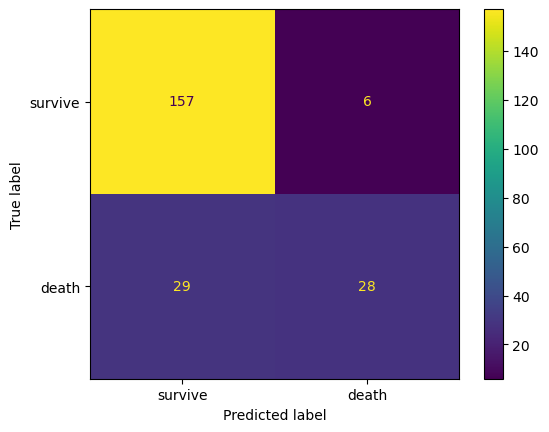

In [266]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();


## Stacking simple

In [267]:
# define the base models
level0 = list()
level0.append(('lr', best_model_))
level0.append(('rf', best_model2_))
level0.append(('XGB', best_model3))
level0.append(('GBM', best_model4))
level0.append(('SVM', best_model5))

# define meta learner model
level1 = LogisticRegression(solver='liblinear')
# define the stacking ensemble
model = StackingClassifier(estimators=level0, final_estimator=level1)


model.fit(X_train, y_train)

#with open("grid_search_resultsStacking.json", "w") as json_file:
#    json.dump(results_dict, json_file, indent=4)

# Evaluate the best model on the testing data
# f1_score_test = best_model.score(X_test, y_test)

best_model6_=model

y_pred = best_model6_.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


#0.8545454545454545 0.7535249165859434 0.6595744680851063 0.543859649122807 0.8378378378378378
#[[157   6]
# [ 26  31]]


[LightGBM] [Info] Number of positive: 228, number of negative: 650
[LightGBM] [Info] Total Bins 433346
[LightGBM] [Info] Number of data points in the train set: 878, number of used features: 1701
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.259681 -> initscore=-1.047627
[LightGBM] [Info] Start training from score -1.047627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

In [268]:
import pickle # save and upload the models characteristics

# Specify the file name where you want to save the dictionary
file_name = "Stakings.pkl"

# Save the dictionary to a file using pickle
with open(file_name, "wb") as pickle_file:
    pickle.dump(best_model6_, pickle_file)
    
# Specify the file name of the .pkl file
file_name = "Stakings.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    Stakings = pickle.load(pickle_file)


In [269]:
# Specify the file name of the .pkl file
file_name = "Stakings.pkl"

# Load the data from the .pkl file
with open(file_name, "rb") as pickle_file:
    Stakings = pickle.load(pickle_file)

In [270]:
best_model6_ = Stakings

In [271]:

y_pred = best_model6_.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)

print(accuracy, balanced_accuracy, f1, recall, precision)
print(confusion_matrix(y_test, y_pred))


0.8454545454545455 0.7359810569368206 0.6304347826086958 0.5087719298245614 0.8285714285714286
[[157   6]
 [ 28  29]]


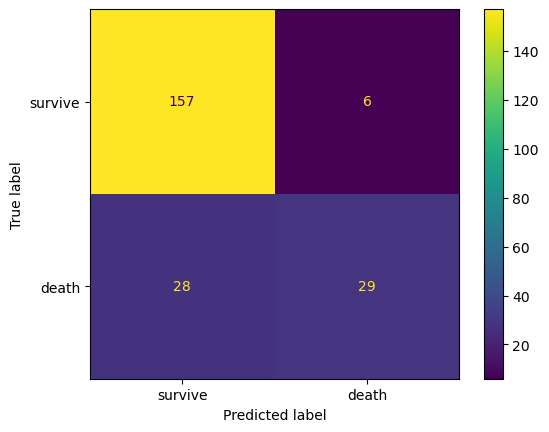

In [272]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['survive', "death"])                                             
                                                 
cmd.plot();


No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.784
Random Forest: ROC AUC=0.820
XGB: ROC AUC=0.816
LGB: ROC AUC=0.808
SVM: ROC AUC=0.844
Stacking: ROC AUC=0.838


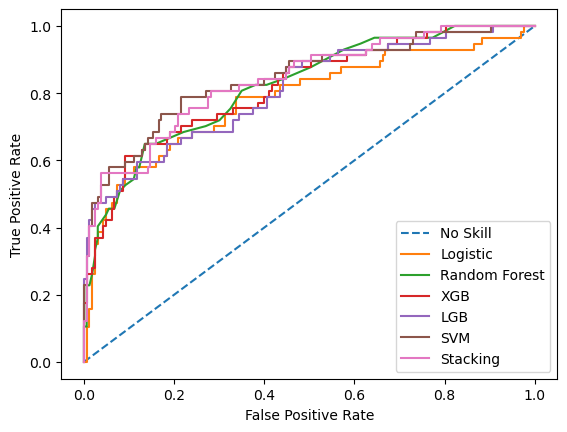

In [287]:
#https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

# roc curve and auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
# fit a model
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3.predict_proba(X_test)
lg_probs = best_model4.predict_proba(X_test)
sv_probs = best_model5.predict_proba(X_test)
st_probs = best_model6_.predict_proba(X_test)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
lg_probs = lg_probs[:, 1]
sv_probs = sv_probs[:, 1]
st_probs = st_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
rf_auc = roc_auc_score(y_test, rf_probs)
xg_auc = roc_auc_score(y_test, xg_probs)
lg_auc = roc_auc_score(y_test, lg_probs)
sv_auc = roc_auc_score(y_test, sv_probs)
st_auc = roc_auc_score(y_test, st_probs)

# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
print('Random Forest: ROC AUC=%.3f' % (rf_auc))
print('XGB: ROC AUC=%.3f' % (xg_auc))
print('LGB: ROC AUC=%.3f' % (lg_auc))
print('SVM: ROC AUC=%.3f' % (sv_auc))
print('Stacking: ROC AUC=%.3f' % (st_auc))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
xg_fpr, xg_tpr, _ = roc_curve(y_test, xg_probs)
lg_fpr, lg_tpr, _ = roc_curve(y_test, lg_probs)
sv_fpr, sv_tpr, _ = roc_curve(y_test, sv_probs)
st_fpr, st_tpr, _ = roc_curve(y_test, st_probs)

# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, label='Logistic')
pyplot.plot(rf_fpr, rf_tpr, label='Random Forest')
pyplot.plot(xg_fpr, xg_tpr, label='XGB')
pyplot.plot(lg_fpr, lg_tpr, label='LGB')
pyplot.plot(sv_fpr, sv_tpr, label='SVM')
pyplot.plot(st_fpr, st_tpr, label='Stacking')

# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


Logistic: f1=0.611 auc=0.605
Random Forest: f1=0.319 auc=0.674
XGB: f1=0.529 auc=0.684
LGB: f1=0.607 auc=0.706
SVM: f1=0.667 auc=0.745
Stacking: f1=0.630 auc=0.721


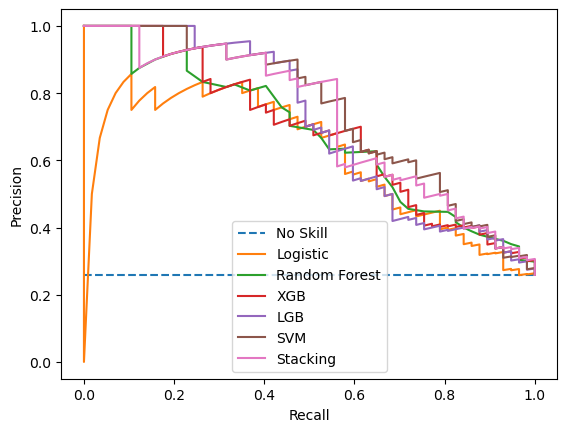

In [288]:
# precision-recall curve and f1
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot

# predict probabilities
lr_probs = best_model_.predict_proba(X_test)
rf_probs = best_model2_.predict_proba(X_test)
xg_probs = best_model3.predict_proba(X_test)
lg_probs = best_model4.predict_proba(X_test)
sv_probs = best_model5.predict_proba(X_test)
st_probs = best_model6_.predict_proba(X_test)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
rf_probs = rf_probs[:, 1]
xg_probs = xg_probs[:, 1]
lg_probs = lg_probs[:, 1]
sv_probs = sv_probs[:, 1]
st_probs = st_probs[:, 1]

# predict class values
yhat = best_model_.predict(X_test)
yhat_1 = best_model2_.predict(X_test)
yhat_2 = best_model3.predict(X_test)
yhat_3 = best_model4.predict(X_test)
yhat_4 = best_model5.predict(X_test)
yhat_5 = best_model6_.predict(X_test)

lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)
xg_precision, xg_recall, _ = precision_recall_curve(y_test, xg_probs)
lg_precision, lg_recall, _ = precision_recall_curve(y_test, lg_probs)
sv_precision, sv_recall, _ = precision_recall_curve(y_test, sv_probs)
st_precision, st_recall, _ = precision_recall_curve(y_test, st_probs)

lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)
rf_f1, rf_auc = f1_score(y_test, yhat_1), auc(rf_recall, rf_precision)
xg_f1, xg_auc = f1_score(y_test, yhat_2), auc(xg_recall, xg_precision)
lg_f1, lg_auc = f1_score(y_test, yhat_3), auc(lg_recall, lg_precision)
sv_f1, sv_auc = f1_score(y_test, yhat_4), auc(sv_recall, sv_precision)
st_f1, st_auc = f1_score(y_test, yhat_5), auc(st_recall, st_precision)

# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
print('Random Forest: f1=%.3f auc=%.3f' % (rf_f1, rf_auc))
print('XGB: f1=%.3f auc=%.3f' % (xg_f1, xg_auc))
print('LGB: f1=%.3f auc=%.3f' % (lg_f1, lg_auc))
print('SVM: f1=%.3f auc=%.3f' % (sv_f1, sv_auc))
print('Stacking: f1=%.3f auc=%.3f' % (st_f1, st_auc))

# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
pyplot.plot(lr_recall, lr_precision, label='Logistic')
pyplot.plot(rf_recall, rf_precision, label='Random Forest')
pyplot.plot(xg_recall, xg_precision, label='XGB')
pyplot.plot(lg_recall, lg_precision, label='LGB')
pyplot.plot(sv_recall, sv_precision, label='SVM')
pyplot.plot(st_recall, st_precision, label='Stacking')

# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()


# Models characteristics

In [306]:
#print(accuracy, balanced_accuracy, f1, recall, precision)

LR=         [0.7727272727272727, 0.7040146378215477, 0.5614035087719298, 0.5614035087719298, 0.5614035087719298]
LRs =       [0.8090909090909091, 0.734258960284146, 0.6111111111111113, 0.5789473684210527, 0.6470588235294118]
RF=         [0.7772727272727272, 0.575879883758476, 0.26865671641791045, 0.15789473684210525, 0.9]
RFs=        [0.8045454545454546, 0.6285114627058443, 0.4109589041095891, 0.2631578947368421, 0.9375]
XGB=        [0.8136363636363636, 0.6802819933268754, 0.528735632183908, 0.40350877192982454, 0.7666666666666667]
XGBs=       [0.8272727272727273, 0.7180066731245291, 0.5957446808510638, 0.49122807017543857, 0.7567567567567568]
LGBM=       [0.8409090909090909, 0.7215046819502744, 0.6067415730337079, 0.47368421052631576, 0.84375]
LGBMs=      [0.8136363636363636, 0.668873103002906, 0.5060240963855421, 0.3684210526315789, 0.8076923076923077]
SMV=        [0.8363636363636363, 0.7355505327736519, 0.625, 0.5263157894736842, 0.7692307692307693]
SMVs=       [0.7636363636363637, 0.5495640942847917, 0.1875, 0.10526315789473684, 0.8571428571428571]
Staking=    [0.85, 0.7333440964374125, 0.6292134831460674, 0.49122807017543857, 0.875]
Stakings=   [0.8545454545454545, 0.7478204714239587, 0.6521739130434783, 0.5263157894736842, 0.8571428571428571]


In [99]:
df = pd.DataFrame([LR, LRs, RF, RFs, XGB, XGBs, LGBM, LGBMs, SMV, SMVs, Staking, Stakings])
df.columns = ["accuracy", "balanced_accuracy", "f1", "recall", "precision"]
df = round(df, 3)*100
index_labels=["LR", "LRs", "RF", "RFs", "XGB", "XGBs", "LGBM", "LGBMs", "SMV", "SMVs", "Staking", "Stakings"]
df.index = index_labels        
df

,accuracy,balanced_accuracy,f1,recall,precision
LR,77.3,70.4,56.1,56.1,56.1
LRs,80.9,73.4,61.1,57.9,64.7
RF,77.7,57.6,26.9,15.8,90.0
RFs,80.5,62.9,41.1,26.3,93.8
XGB,81.4,68.0,52.9,40.4,76.7
XGBs,82.7,71.8,59.6,49.1,75.7
LGBM,84.1,72.2,60.7,47.4,84.4
LGBMs,81.4,66.9,50.6,36.8,80.8
SMV,83.6,73.6,62.5,52.6,76.9
SMVs,76.4,55.0,18.8,10.5,85.7


# Permutation importance

In [275]:
#https://towardsdatascience.com/best-practice-to-calculate-and-interpret-model-feature-importance-14f0e11ee660

from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt

#calculate permutation importance for test data
result_test = permutation_importance(
    best_model6_, X_test, y_test, n_repeats=20, random_state=42, n_jobs=2
)

sorted_importances_idx_test = result_test.importances_mean.argsort()
importances_test = pd.DataFrame(
    result_test.importances[sorted_importances_idx_test].T,
    columns=X_test.columns[sorted_importances_idx_test],
)

#calculate permutation importance for training data
result_train = permutation_importance(
    best_model6_, X_train, y_train, n_repeats=20, random_state=42, n_jobs=2
)

sorted_importances_idx_train = result_train.importances_mean.argsort()
importances_train = pd.DataFrame(
    result_train.importances[sorted_importances_idx_train].T,
    columns=X_train.columns[sorted_importances_idx_train],
)


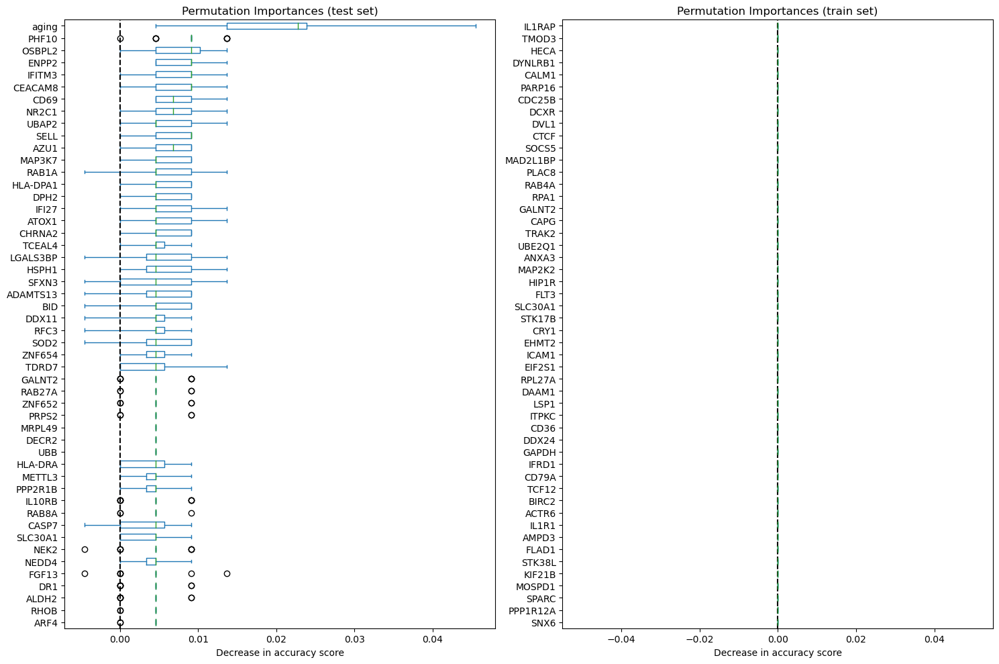

In [276]:
f, axs = plt.subplots(1,2,figsize=(15,10))

importances_test.iloc[:,-50:].plot.box(vert=False, whis=10, ax = axs[0])
#importances_test.plot.box(vert=False, whis=10, ax = axs[0])
axs[0].set_title("Permutation Importances (test set)")
axs[0].axvline(x=0, color="k", linestyle="--")
axs[0].set_xlabel("Decrease in accuracy score")
axs[0].figure.tight_layout()

importances_train.iloc[:,-50:].plot.box(vert=False, whis=10, ax = axs[1])
#importances_train.plot.box(vert=False, whis=10, ax = axs[1])
axs[1].set_title("Permutation Importances (train set)")
axs[1].axvline(x=0, color="k", linestyle="--")
axs[1].set_xlabel("Decrease in accuracy score")
axs[1].figure.tight_layout()

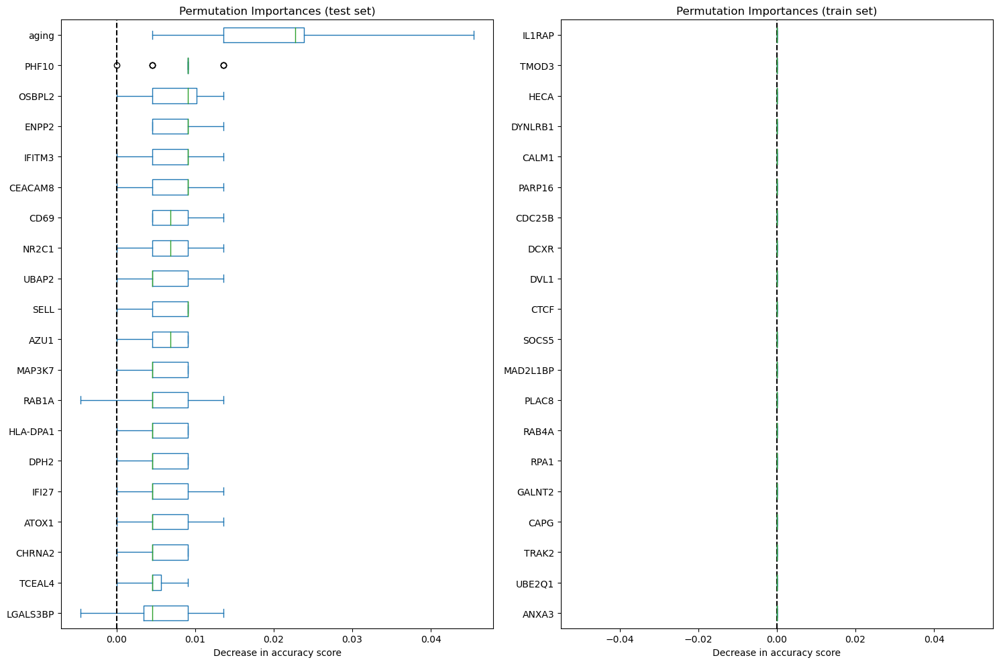

In [277]:
f, axs = plt.subplots(1,2,figsize=(15,10))

importances_test.iloc[:,-20:].plot.box(vert=False, whis=10, ax = axs[0])
#importances_test.plot.box(vert=False, whis=10, ax = axs[0])
axs[0].set_title("Permutation Importances (test set)")
axs[0].axvline(x=0, color="k", linestyle="--")
axs[0].set_xlabel("Decrease in accuracy score")
axs[0].figure.tight_layout()

importances_train.iloc[:,-20:].plot.box(vert=False, whis=10, ax = axs[1])
#importances_train.plot.box(vert=False, whis=10, ax = axs[1])
axs[1].set_title("Permutation Importances (train set)")
axs[1].axvline(x=0, color="k", linestyle="--")
axs[1].set_xlabel("Decrease in accuracy score")
axs[1].figure.tight_layout()

# Drop column importance

In [ ]:
# drop column importance
import numpy as np
import pandas as pd
from sklearn.base import clone
from sklearn.ensemble import StackingClassifier

def dropcol_importances(estimator, X, y):
    baseline = estimator.score(X, y)  # Baseline accuracy without dropping any feature
    importances = []
    for col in X.columns:
        X_drop = X.drop(columns=col)
        estimator_drop = clone(estimator)
        estimator_drop.fit(X_drop, y)
        drop_acc = estimator_drop.score(X_drop, y)
        importance = baseline - drop_acc
        importances.append(importance)
    return importances

# Example usage

importances = dropcol_importances(best_model6_, X_test, y_test)
importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': importances})
#importance_df.plot(kind='barh', x='Feature', y='Importance')
sorted_df = importance_df.sort_values(by='Importance')
sorted_df.iloc[-20:, :].plot(kind='barh', x='Feature', y='Importance');
#sorted_df.plot(kind='barh', x='Feature', y='Importance');


[LightGBM] [Info] Number of positive: 57, number of negative: 163
[LightGBM] [Info] Total Bins 127364
[LightGBM] [Info] Number of data points in the train set: 220, number of used features: 1700
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.259091 -> initscore=-1.050699
[LightGBM] [Info] Start training from score -1.050699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

# Shap

In [ ]:
#!pip install shap

In [295]:
#https://towardsdatascience.com/using-shap-values-to-explain-how-your-machine-learning-model-works-732b3f40e137

import shap

explainer = shap.Explainer(best_model6_.predict, X_test, max_evals=3403)

shap_values = explainer(X_test)


Permutation explainer: 221it [18:04:12, 295.69s/it]                             


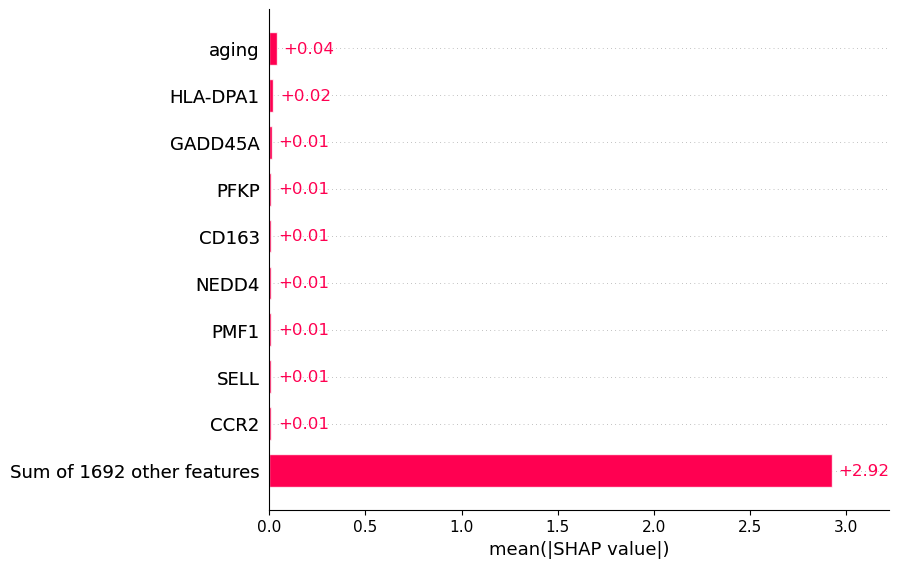

In [298]:
shap.plots.bar(shap_values)


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


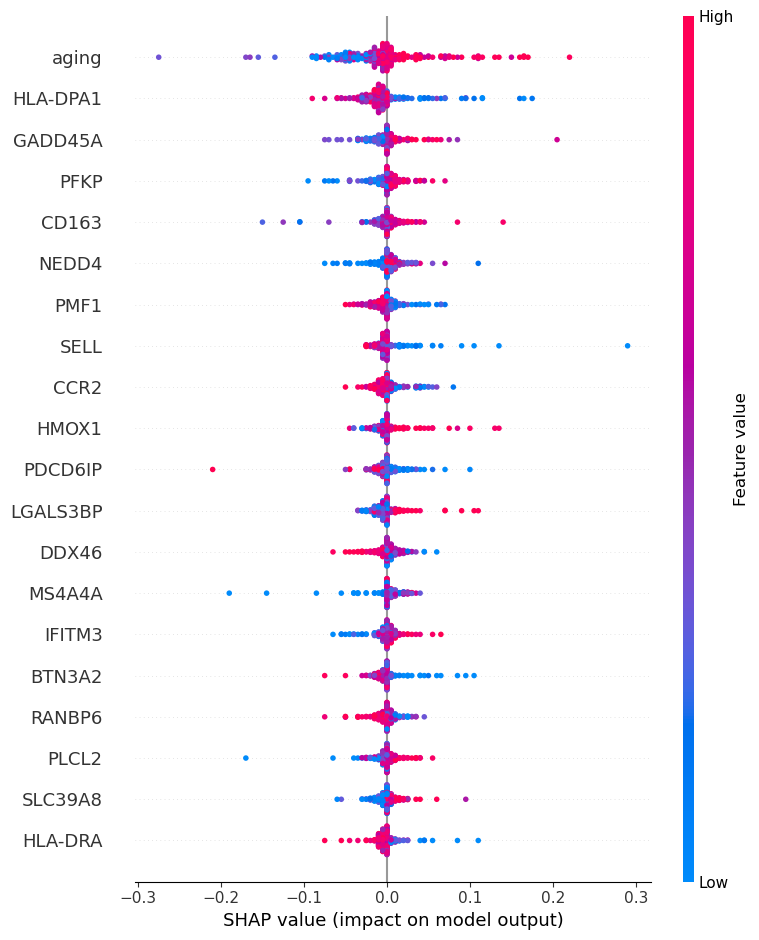

In [299]:
shap.summary_plot(shap_values)


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


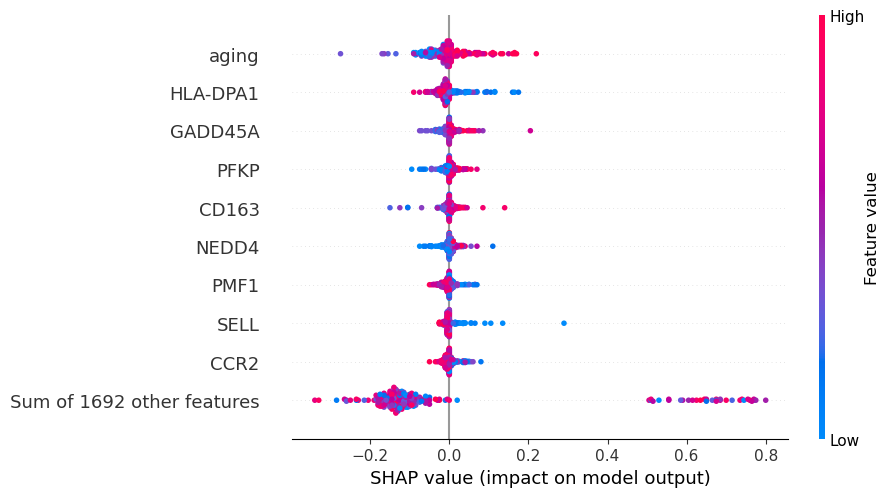

In [300]:
shap.plots.beeswarm(shap_values)


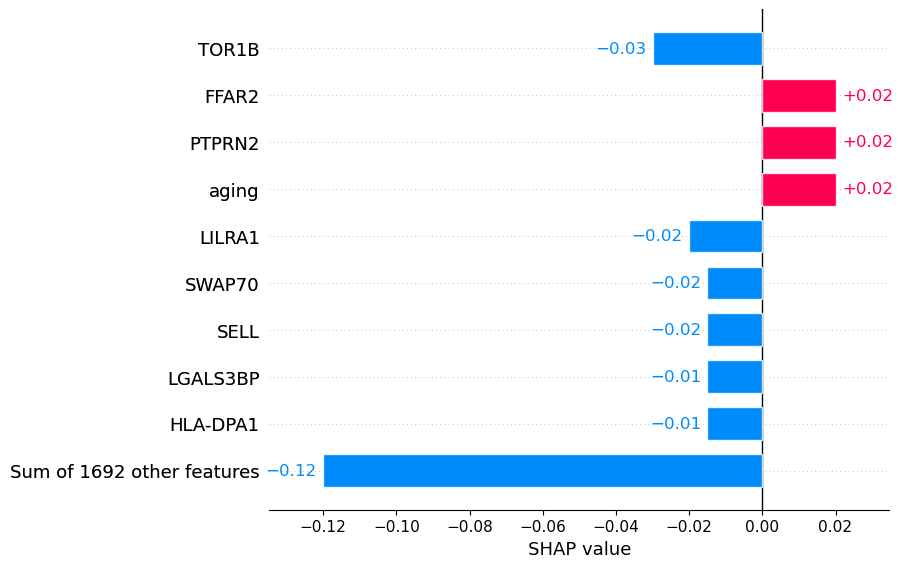

In [301]:
shap.plots.bar(shap_values[10])

In [302]:
#from IPython.display import initjs


import shap

# Assuming you have computed SHAP values (shap_values) for your model and data
shap.initjs()  # Initialize JavaScript (may not be necessary in some environments)

# Create a SHAP force plot for the first instance (adjust as needed)
shap.plots.force(shap_values[10])

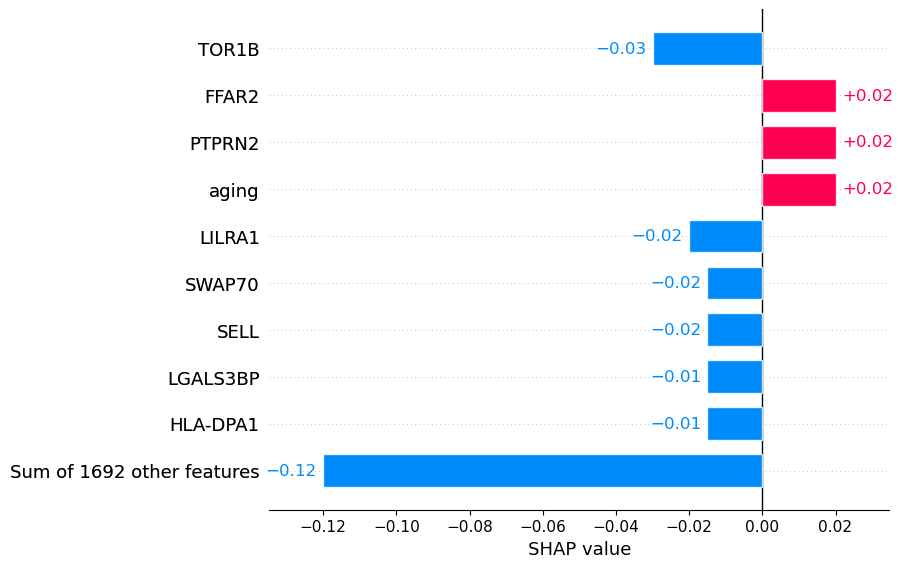

In [303]:

shap.plots.bar(shap_values[10])


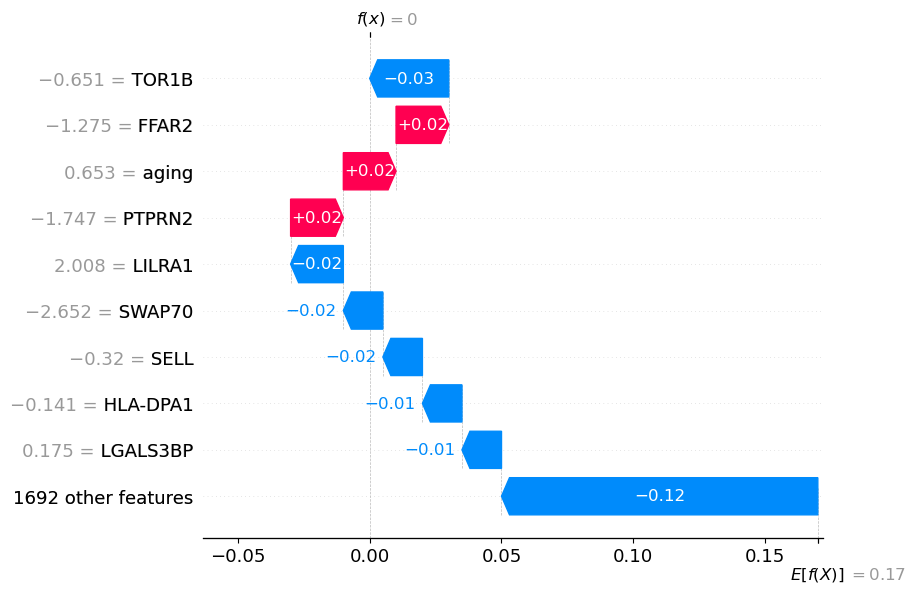

In [304]:
shap.plots.waterfall(shap_values[10])
